# Problem Statement:
Develop a machine learning model to accurately identify fraudulent credit card transactions among a dataset of European cardholder transactions from the year 2023.

## Step 1: Import Python Libraries

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder,PolynomialFeatures,StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
%matplotlib inline

In [49]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.svm import SVC


In [50]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score


## Step 2: Reading Dataset

In [2]:
df = pd.read_csv('creditcard_2023.csv')

#### Analyzing the Data

In [4]:
pd.set_option('display.max_columns', None)
df.head()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,0.637735,-0.987020,0.293438,-0.941386,0.549020,1.804879,0.215598,0.512307,0.333644,0.124270,0.091202,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,17982.10,0
1,1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,0.529808,0.140107,1.564246,0.574074,0.627719,0.706121,0.789188,0.403810,0.201799,-0.340687,-0.233984,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,6531.37,0
2,2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,0.690708,-0.272985,0.659201,0.805173,0.616874,3.069025,-0.577514,0.886526,0.239442,-2.366079,0.361652,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,2513.54,0
3,3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,0.575231,-0.752581,0.737483,0.592994,0.559535,-0.697664,-0.030669,0.242629,2.178616,-1.345060,-0.378223,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,5384.44,0
4,4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,0.968046,-1.203171,1.029577,1.439310,0.241454,0.153008,0.224538,0.366466,0.291782,0.445317,0.247237,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,14278.97,0


In [9]:
df.tail()


,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
568625,568625,-0.833437,0.061886,-0.899794,0.904227,-1.002401,0.481454,-0.370393,0.189694,-0.938153,-1.161847,1.430971,-1.330500,-1.580730,-1.363454,0.287766,-1.480796,-1.520928,-1.376970,1.789103,-0.751011,0.167503,0.419731,1.288249,-0.900861,0.560661,-0.006018,3.308968,0.081564,4394.16,1
568626,568626,-0.670459,-0.202896,-0.068129,-0.267328,-0.133660,0.237148,-0.016935,-0.147733,0.483894,-0.210817,0.173590,-0.539948,0.738315,-0.812043,0.870447,-0.545184,-0.575991,-0.664313,0.101604,-0.550260,0.031874,0.388161,-0.154257,-0.846452,-0.153443,1.961398,-1.528642,1.704306,4653.40,1
568627,568627,-0.311997,-0.004095,0.137526,-0.035893,-0.042291,0.121098,-0.070958,-0.019997,-0.122048,-0.144495,0.477582,-0.461849,-0.606100,-0.395126,-0.040673,-0.370201,-0.729002,-0.251679,-0.343196,-0.076417,0.140788,0.536523,-0.211100,-0.448909,0.540073,-0.755836,-0.487540,-0.268741,23572.85,1
568628,568628,0.636871,-0.516970,-0.300889,-0.144480,0.131042,-0.294148,0.580568,-0.207723,0.893527,-0.080078,-0.324934,0.335215,0.464177,-0.390369,0.893881,0.477402,0.848443,0.930280,-0.481058,0.288186,-0.060381,-0.195609,-0.175488,-0.554643,-0.099669,-1.434931,-0.159269,-0.076251,10160.83,1
568629,568629,-0.795144,0.433236,-0.649140,0.374732,-0.244976,-0.603493,-0.347613,-0.340814,0.253971,-0.513556,0.892136,-1.153011,0.489197,-1.062488,0.207773,-0.917240,-0.936114,-0.823688,-0.330408,-0.621378,0.534853,-0.291514,0.157303,0.931030,-0.349423,-1.090974,-1.575113,0.722936,21493.92,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568630 entries, 0 to 568629
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      568630 non-null  int64  
 1   V1      568630 non-null  float64
 2   V2      568630 non-null  float64
 3   V3      568630 non-null  float64
 4   V4      568630 non-null  float64
 5   V5      568630 non-null  float64
 6   V6      568630 non-null  float64
 7   V7      568630 non-null  float64
 8   V8      568630 non-null  float64
 9   V9      568630 non-null  float64
 10  V10     568630 non-null  float64
 11  V11     568630 non-null  float64
 12  V12     568630 non-null  float64
 13  V13     568630 non-null  float64
 14  V14     568630 non-null  float64
 15  V15     568630 non-null  float64
 16  V16     568630 non-null  float64
 17  V17     568630 non-null  float64
 18  V18     568630 non-null  float64
 19  V19     568630 non-null  float64
 20  V20     568630 non-null  float64
 21  V21     56

##### All columns are numerical type

#### Missing Values Calculation

In [12]:
df.isnull().sum()

id        0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

##### There are `0` null value in our dataset 

#### Percentage of missing values in each column

In [14]:
(df.isnull().sum()/(len(df)))*100

id        0.0
V1        0.0
V2        0.0
V3        0.0
V4        0.0
V5        0.0
V6        0.0
V7        0.0
V8        0.0
V9        0.0
V10       0.0
V11       0.0
V12       0.0
V13       0.0
V14       0.0
V15       0.0
V16       0.0
V17       0.0
V18       0.0
V19       0.0
V20       0.0
V21       0.0
V22       0.0
V23       0.0
V24       0.0
V25       0.0
V26       0.0
V27       0.0
V28       0.0
Amount    0.0
Class     0.0
dtype: float64

##### Checking Shape of dataset

In [6]:
df.shape

(568630, 31)

#### Statistics Summary Dataset

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,568630.0,2.843145e+05,164149.486122,0.000000,142157.250000,284314.500000,426471.750000,568629.000000
V1,568630.0,-5.638058e-17,1.000001,-3.495584,-0.565286,-0.093638,0.832658,2.229046
V2,568630.0,-1.319545e-16,1.000001,-49.966572,-0.486678,-0.135894,0.343555,4.361865
V3,568630.0,-3.518788e-17,1.000001,-3.183760,-0.649299,0.000353,0.628538,14.125834
V4,568630.0,-2.879008e-17,1.000001,-4.951222,-0.656020,-0.073762,0.707005,3.201536
V5,568630.0,7.997245e-18,1.000001,-9.952786,-0.293496,0.081088,0.439737,42.716891
V6,568630.0,-3.958636e-17,1.000001,-21.111108,-0.445871,0.078718,0.497788,26.168402
V7,568630.0,-3.198898e-17,1.000001,-4.351839,-0.283533,0.233366,0.525955,217.873038
V8,568630.0,2.109273e-17,1.000001,-10.756342,-0.192257,-0.114524,0.047299,5.958040
V9,568630.0,3.998623e-17,1.000001,-3.751919,-0.568745,0.092526,0.559262,20.270062


## Step 3: EDA Exploratory Data Analysis

### Univariate Analysis

####  Histogram and  Box Plot for Amount column.

Skew : 0.0


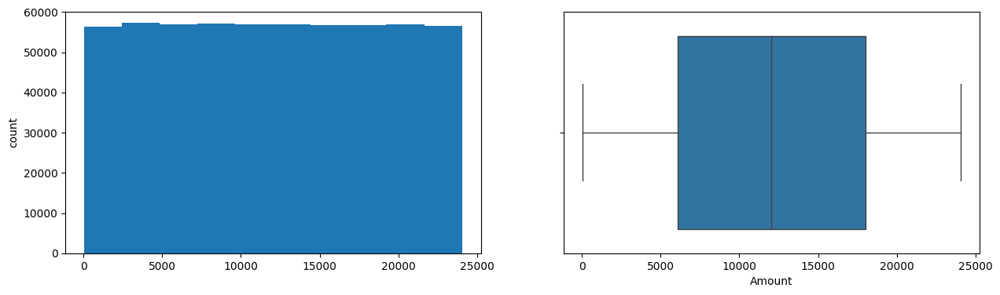

In [17]:
print('Skew :', round(df['Amount'].skew(), 2))
plt.figure(figsize = (15, 4))
plt.subplot(1, 2, 1)
df['Amount'].hist(grid=False)
plt.ylabel('count')
plt.subplot(1, 2, 2)
sns.boxplot(x=df['Amount'])
plt.show()

#### The value in Amount column are well distributed and there are `0` outliers in Amount column

### Plotting Histogram for all columns

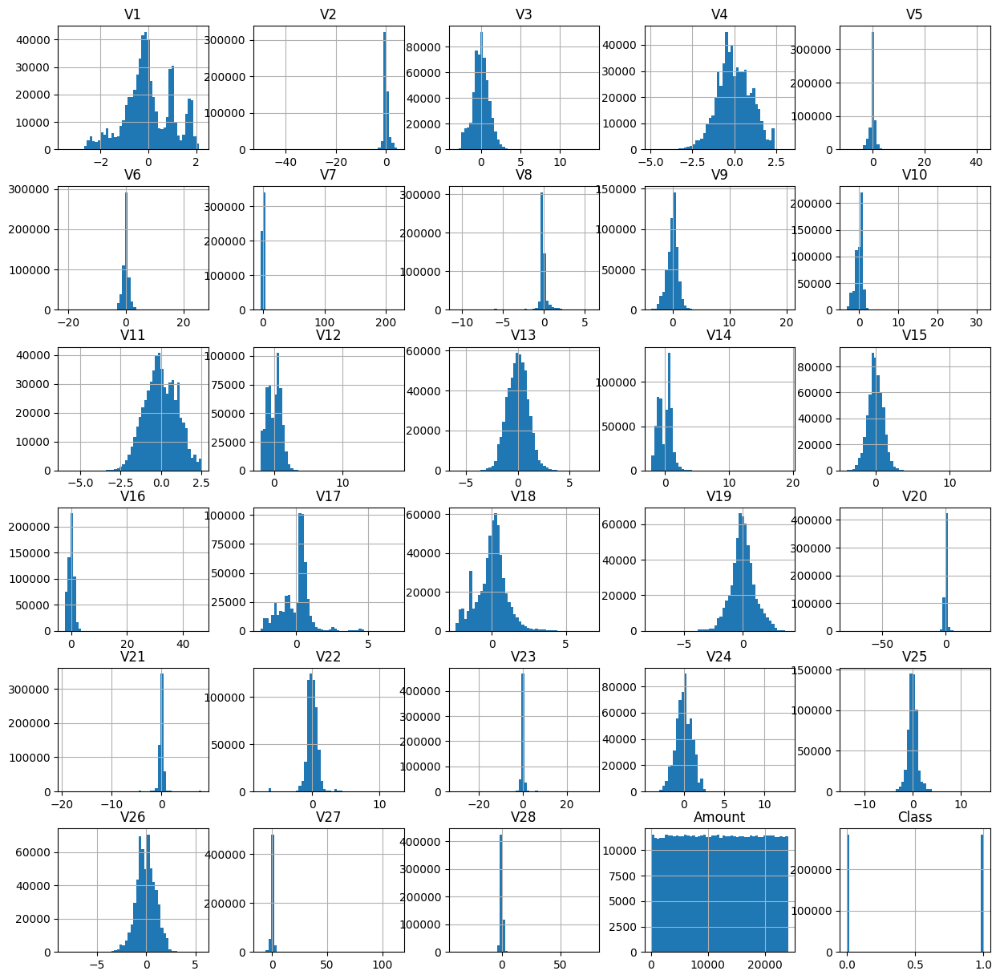

In [34]:
df.hist(bins=50,figsize=(15,15))
plt.show()

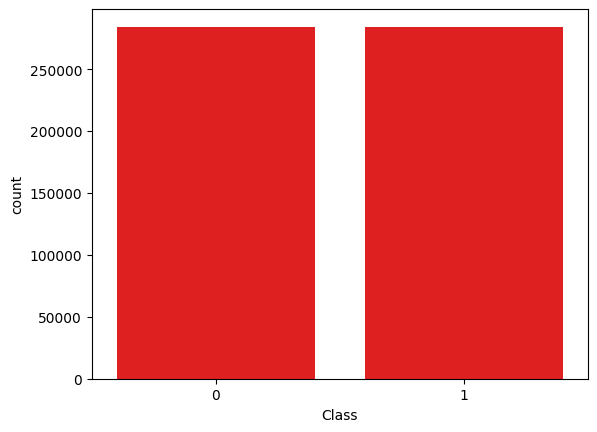

In [ ]:
sns.countplot(x='Class', data=df,color = 'red')

plt.show()

In [21]:
df['Class'].value_counts()

Class
0    284315
1    284315
Name: count, dtype: int64

#### Our Data is perfectely Balanced

### Bivariate Analysis

In [20]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df.drop('id',axis=1))
plt.show()

<Figure size 1300x1700 with 0 Axes>

### Looking at above pair plot we can say that some features have '+' correlation, some have '-' correlation and some are not correlated with each other

### Multivariate Analysis

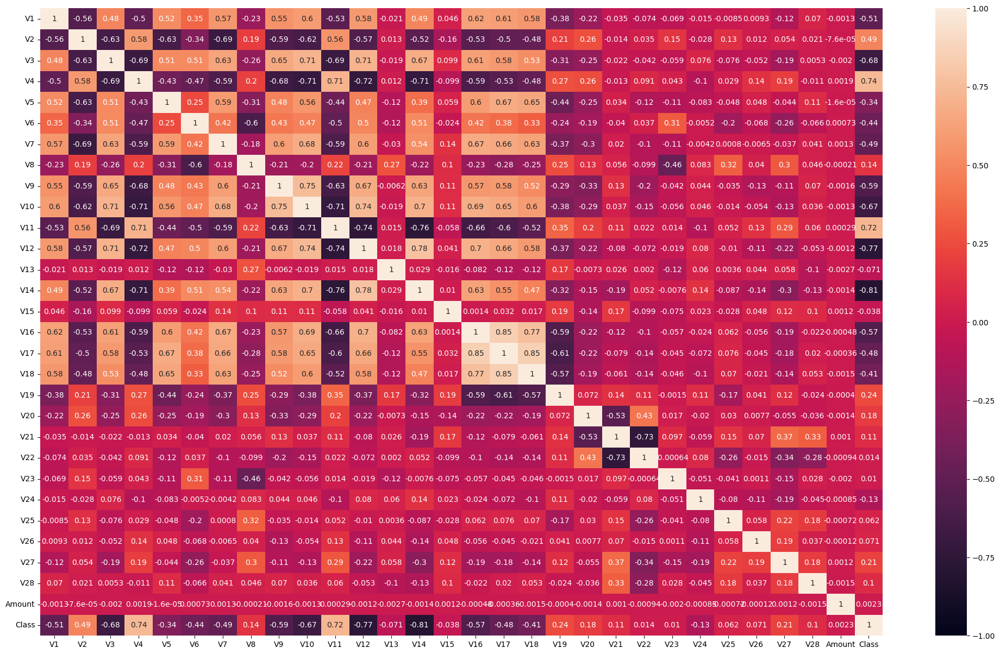

In [26]:
plt.figure(figsize=(25, 15))
sns.heatmap(df.drop('id',axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

#### Dropping ID column because it don't add any value to target column

In [29]:
df =df.drop('id',axis=1)

## Step 4 : Features Selection

In [30]:
corr_matrix = df.corr()
print(corr_matrix["Class"].sort_values(ascending=False))

Class     1.000000
V4        0.735981
V11       0.724278
V2        0.491878
V19       0.244081
V27       0.214002
V20       0.179851
V8        0.144294
V21       0.109640
V28       0.102024
V26       0.071052
V25       0.061847
V22       0.014098
V23       0.010255
Amount    0.002261
V15      -0.037948
V13      -0.071105
V24      -0.130107
V5       -0.338639
V18      -0.410091
V6       -0.435088
V17      -0.476377
V7       -0.491234
V1       -0.505761
V16      -0.573511
V9       -0.585522
V10      -0.673665
V3       -0.682095
V12      -0.768579
V14      -0.805669
Name: Class, dtype: float64


## Step 5 : Model Building 

## 1.Selecting features who have correlation > 0.5

In [36]:
corr_matrix = df.corr()

abs_corr_matrix = corr_matrix.abs()

selected_columns_5 = abs_corr_matrix[abs_corr_matrix["Class"] > 0.5].index
print(selected_columns_5)

Index(['V1', 'V3', 'V4', 'V9', 'V10', 'V11', 'V12', 'V14', 'V16', 'Class'], dtype='object')


In [43]:
X = df[selected_columns_5]
X = X.drop('Class',axis=1)
X

,V1,V3,V4,V9,V10,V11,V12,V14,V16
0,-0.260648,2.496266,-0.083724,0.727159,0.637735,-0.987020,0.293438,0.549020,0.215598
1,0.985100,0.558056,-0.429654,0.347452,0.529808,0.140107,1.564246,0.627719,0.789188
2,-0.260272,1.728538,-0.457986,-0.261297,0.690708,-0.272985,0.659201,0.616874,-0.577514
3,-0.152152,1.746840,-1.090178,-0.205698,0.575231,-0.752581,0.737483,0.559535,-0.030669
4,-0.206820,1.527053,-0.448293,1.049921,0.968046,-1.203171,1.029577,0.241454,0.224538
...,...,...,...,...,...,...,...,...,...
568625,-0.833437,-0.899794,0.904227,-0.938153,-1.161847,1.430971,-1.330500,-1.363454,-1.480796
568626,-0.670459,-0.068129,-0.267328,0.483894,-0.210817,0.173590,-0.539948,-0.812043,-0.545184
568627,-0.311997,0.137526,-0.035893,-0.122048,-0.144495,0.477582,-0.461849,-0.395126,-0.370201
568628,0.636871,-0.300889,-0.144480,0.893527,-0.080078,-0.324934,0.335215,-0.390369,0.477402


In [45]:
Y = df['Class']
Y

0         0
1         0
2         0
3         0
4         0
         ..
568625    1
568626    1
568627    1
568628    1
568629    1
Name: Class, Length: 568630, dtype: int64

#### Splitting data into trainning and testing data

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.25,random_state=0)

### Model 1 : Decision Trees

In [51]:
DT = DecisionTreeClassifier(criterion='entropy')
DT.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [52]:
DT.score(X_test,y_test)

0.9973480212158303

In [53]:
y_pred = DT.predict(X_test)

In [54]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70856
           1       1.00      1.00      1.00     71302

    accuracy                           1.00    142158
   macro avg       1.00      1.00      1.00    142158
weighted avg       1.00      1.00      1.00    142158



In [74]:
from sklearn.model_selection import KFold, cross_val_score

In [75]:
clf = DecisionTreeClassifier(criterion='entropy',random_state=0)

In [80]:
k_folds = KFold(n_splits = 10)

In [81]:
scores = cross_val_score(clf, X, Y, cv = k_folds)

In [82]:
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())

Cross Validation Scores:  [0.9922621  0.99600795 0.99500554 0.99542761 0.99588485 0.99862828
 0.99857552 0.99787208 0.99864587 0.99866345]
Average CV Score:  0.9966973251499216


### Model 2 : Random Forest

In [55]:
RF = RandomForestClassifier(n_estimators=100,criterion='entropy')
RF.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy')

In [56]:
y_pred = RF.predict(X_test)

In [57]:
accuracy_score(y_test,y_pred)

0.9996201409699067

In [58]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70856
           1       1.00      1.00      1.00     71302

    accuracy                           1.00    142158
   macro avg       1.00      1.00      1.00    142158
weighted avg       1.00      1.00      1.00    142158



### Model 3 : Gradient Boosting

In [59]:
GB = GradientBoostingClassifier(loss="log_loss",n_estimators=100)
GB.fit(X_train,y_train)

GradientBoostingClassifier()

In [60]:
y_pred = GB.predict(X_test)

In [61]:
accuracy_score(y_test,y_pred)

0.9720240858762785

In [62]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     70856
           1       0.98      0.96      0.97     71302

    accuracy                           0.97    142158
   macro avg       0.97      0.97      0.97    142158
weighted avg       0.97      0.97      0.97    142158



In [180]:
result1 = pd.DataFrame({
    'Model':['Decision Tree Classifier','Random Forest Classifier','Gradient Boosting Classifier'],
    'Score' : [0.9973480212158303,0.9996201409699067,0.9720240858762785]
})

In [181]:
result1

,Model,Score
0,Decision Tree Classifier,0.997348
1,Random Forest Classifier,0.999620
2,Gradient Boosting Classifier,0.972024


## 1.Selecting features who have correlation > 0.3

In [140]:
corr_matrix = df.corr()

abs_corr_matrix = corr_matrix.abs()

selected_columns_5 = abs_corr_matrix[abs_corr_matrix["Class"] > 0.3].index
print(selected_columns_5)

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'Class'],
      dtype='object')


In [141]:
X = df[selected_columns_5]
X = X.drop('Class',axis=1)
X


,V1,V2,V3,V4,V5,V6,V7,V9,V10,V11,V12,V14,V16,V17,V18
0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,0.727159,0.637735,-0.987020,0.293438,0.549020,0.215598,0.512307,0.333644
1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,0.347452,0.529808,0.140107,1.564246,0.627719,0.789188,0.403810,0.201799
2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.261297,0.690708,-0.272985,0.659201,0.616874,-0.577514,0.886526,0.239442
3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.205698,0.575231,-0.752581,0.737483,0.559535,-0.030669,0.242629,2.178616
4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,1.049921,0.968046,-1.203171,1.029577,0.241454,0.224538,0.366466,0.291782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568625,-0.833437,0.061886,-0.899794,0.904227,-1.002401,0.481454,-0.370393,-0.938153,-1.161847,1.430971,-1.330500,-1.363454,-1.480796,-1.520928,-1.376970
568626,-0.670459,-0.202896,-0.068129,-0.267328,-0.133660,0.237148,-0.016935,0.483894,-0.210817,0.173590,-0.539948,-0.812043,-0.545184,-0.575991,-0.664313
568627,-0.311997,-0.004095,0.137526,-0.035893,-0.042291,0.121098,-0.070958,-0.122048,-0.144495,0.477582,-0.461849,-0.395126,-0.370201,-0.729002,-0.251679
568628,0.636871,-0.516970,-0.300889,-0.144480,0.131042,-0.294148,0.580568,0.893527,-0.080078,-0.324934,0.335215,-0.390369,0.477402,0.848443,0.930280


In [152]:
Y = df['Class']
Y


0         0
1         0
2         0
3         0
4         0
         ..
568625    1
568626    1
568627    1
568628    1
568629    1
Name: Class, Length: 568630, dtype: int64

In [153]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.25,random_state=0)


### Model 1 : Decision Trees


In [154]:
DT = DecisionTreeClassifier(criterion='entropy')
DT.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [155]:
DT.score(X_test,y_test)

0.9981218081289832

In [156]:
y_pred = DT.predict(X_test)

In [157]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70856
           1       1.00      1.00      1.00     71302

    accuracy                           1.00    142158
   macro avg       1.00      1.00      1.00    142158
weighted avg       1.00      1.00      1.00    142158



In [158]:
k_folds = KFold(n_splits = 10)

In [159]:
scores = cross_val_score(DT, X, Y, cv = k_folds)

In [160]:
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())


Cross Validation Scores:  [0.9928952  0.99750277 0.99625415 0.99648277 0.9969576  0.99912069
 0.99894483 0.99871621 0.99910311 0.99892725]
Average CV Score:  0.9974904595255263


### Model 2 : Random Forest

In [161]:
RF = RandomForestClassifier(n_estimators=100,criterion='entropy')
RF.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy')

In [162]:
y_pred = RF.predict(X_test)


In [163]:
accuracy_score(y_test,y_pred)

0.9998241393379198

In [164]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70856
           1       1.00      1.00      1.00     71302

    accuracy                           1.00    142158
   macro avg       1.00      1.00      1.00    142158
weighted avg       1.00      1.00      1.00    142158



### Model 3 : Gradient Boosting

In [165]:
GB = GradientBoostingClassifier(loss="log_loss",n_estimators=100)
GB.fit(X_train,y_train)

GradientBoostingClassifier()

In [166]:
y_pred = GB.predict(X_test)


In [167]:
accuracy_score(y_test,y_pred)

0.9759281925744594

In [168]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     70856
           1       0.99      0.96      0.98     71302

    accuracy                           0.98    142158
   macro avg       0.98      0.98      0.98    142158
weighted avg       0.98      0.98      0.98    142158



In [178]:
result2= pd.DataFrame({
    'Model':['Decision Tree Classifier','Random Forest Classifier','Gradient Boosting Classifier'],
    'Score' : [0.9981218081289832,0.9998241393379198,0.9759281925744594]
})

In [179]:
result2

,Model,Score
0,Decision Tree Classifier,0.998122
1,Random Forest Classifier,0.999824
2,Gradient Boosting Classifier,0.975928


# Neural Network

### Model 1 : ANN

In [93]:
X1 = df.drop('Class',axis=1)
Y1 = df['Class']

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X1,Y1,test_size=0.3,random_state=0)

In [115]:
X1.shape

(568630, 29)

In [101]:
import tensorflow as tf
from tensorflow import keras

In [116]:
model = keras.Sequential([
    keras.layers.Dense(29,input_dim=29,activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])

model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

model.fit(X_train,y_train,epochs=50,batch_size=1000)

Epoch 1/50
399/399 [==============================] - 2s 2ms/step - loss: 10.0560 - accuracy: 0.5685
Epoch 2/50
399/399 [==============================] - 1s 2ms/step - loss: 1.7240 - accuracy: 0.7641
Epoch 3/50
399/399 [==============================] - 1s 2ms/step - loss: 0.8340 - accuracy: 0.8147
Epoch 4/50
399/399 [==============================] - 1s 2ms/step - loss: 0.7935 - accuracy: 0.8358
Epoch 5/50
399/399 [==============================] - 1s 2ms/step - loss: 0.6375 - accuracy: 0.8581
Epoch 6/50
399/399 [==============================] - 1s 2ms/step - loss: 1.1254 - accuracy: 0.8461
Epoch 7/50
399/399 [==============================] - 1s 2ms/step - loss: 0.5884 - accuracy: 0.8861
Epoch 8/50
399/399 [==============================] - 1s 2ms/step - loss: 0.9619 - accuracy: 0.8629
Epoch 9/50
399/399 [==============================] - 1s 2ms/step - loss: 0.7510 - accuracy: 0.8863
Epoch 10/50
399/399 [==============================] - 1s 2ms/step - loss: 0.6810 - accuracy: 0.896

In [117]:
model.evaluate(X_test,y_test)

5331/5331 [==============================] - 8s 1ms/step - loss: 0.1462 - accuracy: 0.9523


[0.14620627462863922, 0.9523005485534668]

In [118]:
y_pred = model.predict(X_test)

5331/5331 [==============================] - 7s 1ms/step


In [119]:
print(y_pred[:10])

[[1.        ]
 [1.        ]
 [0.99999994]
 [0.00373811]
 [1.        ]
 [0.04884701]
 [1.        ]
 [0.0019948 ]
 [0.99997145]
 [1.        ]]


In [120]:
y_pred = np.round(y_pred)
print(y_pred[:10])

[[1.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [1.]]


In [121]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     85172
           1       0.99      0.92      0.95     85417

    accuracy                           0.95    170589
   macro avg       0.95      0.95      0.95    170589
weighted avg       0.95      0.95      0.95    170589



## Model 2 : RNN(LSTM)

In [123]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [133]:
lstm = keras.Sequential([
    keras.layers.LSTM(50, input_shape=(29, 1), return_sequences=True),
    keras.layers.LSTM(25),
    keras.layers.Dense(1, activation='sigmoid')
])

lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

lstm.fit(X_train, y_train, epochs=10, batch_size=1000)


Epoch 1/10
399/399 [==============================] - 74s 163ms/step - loss: 0.2449 - accuracy: 0.9085
Epoch 2/10
399/399 [==============================] - 68s 171ms/step - loss: 0.1271 - accuracy: 0.9551
Epoch 3/10
399/399 [==============================] - 68s 169ms/step - loss: 0.1023 - accuracy: 0.9646
Epoch 4/10
399/399 [==============================] - 66s 166ms/step - loss: 0.0849 - accuracy: 0.9708
Epoch 5/10
399/399 [==============================] - 65s 164ms/step - loss: 0.0663 - accuracy: 0.9772
Epoch 6/10
399/399 [==============================] - 65s 164ms/step - loss: 0.0510 - accuracy: 0.9820
Epoch 7/10
399/399 [==============================] - 64s 160ms/step - loss: 0.0408 - accuracy: 0.9852
Epoch 8/10
399/399 [==============================] - 66s 166ms/step - loss: 0.0320 - accuracy: 0.9886
Epoch 9/10
399/399 [==============================] - 66s 164ms/step - loss: 0.0272 - accuracy: 0.9904
Epoch 10/10
399/399 [==============================] - 66s 165ms/step - l

In [134]:
lstm.evaluate(X_test,y_test)

5331/5331 [==============================] - 70s 13ms/step - loss: 0.0297 - accuracy: 0.9889


[0.029660664498806, 0.9889090061187744]

In [139]:
y_pred = lstm.predict(X_test)

5331/5331 [==============================] - 65s 12ms/step


In [136]:
y_pred = np.round(y_pred)

In [137]:
accuracy_score(y_test,y_pred)

0.9889090152354489

In [138]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     85172
           1       0.99      0.99      0.99     85417

    accuracy                           0.99    170589
   macro avg       0.99      0.99      0.99    170589
weighted avg       0.99      0.99      0.99    170589



In [176]:
result3 = pd.DataFrame({
    'Model':['ANN','LSTM'],
    'Score' : [0.9523005485534668,0.9889090152354489]
})

In [177]:
result3

,Model,Score
0,ANN,0.952301
1,LSTM,0.988909


### Building Neural network by performing hyper tunning

In [185]:
X1 = df.drop('Class',axis=1)
Y1 = df['Class']

In [186]:
X_train, X_test, y_train, y_test = train_test_split(X1,Y1,test_size=0.3,random_state=0)

## Model 1 : ANN

In [187]:
ann = keras.Sequential([
    keras.layers.Dense(29,input_dim=29,activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])


ann.compile(loss='binary_crossentropy',optimizer='SGD',metrics=['accuracy'])

ann.fit(X_train,y_train,epochs=40,batch_size=500)

Epoch 1/40
797/797 [==============================] - 3s 2ms/step - loss: 223348572160.0000 - accuracy: 0.4999
Epoch 2/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.4996
Epoch 3/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6932 - accuracy: 0.4997
Epoch 4/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.5008
Epoch 5/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.4997
Epoch 6/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.5005
Epoch 7/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.5003
Epoch 8/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.4999
Epoch 9/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6931 - accuracy: 0.4992
Epoch 10/40
797/797 [==============================] - 2s 2ms/step - loss: 0.6932 - accur

In [188]:
ann.evaluate(X_test,y_test)

5331/5331 [==============================] - 7s 1ms/step - loss: 0.6931 - accuracy: 0.4993


[0.6931204795837402, 0.4992819130420685]

In [189]:
y_pred = ann.predict(X_test)
y_pred = np.round(y_pred)

5331/5331 [==============================] - 7s 1ms/step


In [190]:
accuracy_score(y_test,y_pred)

0.4992818997707941

In [191]:
print(classification_report(y_test,y_pred))

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.50      1.00      0.67     85172
           1       0.00      0.00      0.00     85417

    accuracy                           0.50    170589
   macro avg       0.25      0.50      0.33    170589
weighted avg       0.25      0.50      0.33    170589



## Model 2 : LSTM

In [192]:
lstm = keras.Sequential([
    keras.layers.LSTM(50, input_shape=(29, 1), return_sequences=True),
    keras.layers.LSTM(25),
    keras.layers.Dense(1, activation='sigmoid')
])

lstm.compile(loss='binary_crossentropy', optimizer='SGD', metrics=['accuracy'])

lstm.fit(X_train, y_train, epochs=10, batch_size=500)

Epoch 1/10
797/797 [==============================] - 47s 53ms/step - loss: 0.5490 - accuracy: 0.7968
Epoch 2/10
797/797 [==============================] - 44s 55ms/step - loss: 0.3499 - accuracy: 0.8666
Epoch 3/10
797/797 [==============================] - 41s 52ms/step - loss: 0.3310 - accuracy: 0.8720
Epoch 4/10
797/797 [==============================] - 46s 58ms/step - loss: 0.3177 - accuracy: 0.8778
Epoch 5/10
797/797 [==============================] - 39s 49ms/step - loss: 0.3065 - accuracy: 0.8832
Epoch 6/10
797/797 [==============================] - 37s 46ms/step - loss: 0.2943 - accuracy: 0.8881
Epoch 7/10
797/797 [==============================] - 41s 51ms/step - loss: 0.2742 - accuracy: 0.8958
Epoch 8/10
797/797 [==============================] - 38s 48ms/step - loss: 0.2129 - accuracy: 0.9225
Epoch 9/10
797/797 [==============================] - 38s 48ms/step - loss: 0.1856 - accuracy: 0.9338
Epoch 10/10
797/797 [==============================] - 38s 48ms/step - loss: 0.175

In [193]:
lstm.evaluate(X_test,y_test)

5331/5331 [==============================] - 31s 6ms/step - loss: 0.1945 - accuracy: 0.9294


[0.19453094899654388, 0.9294151663780212]

In [194]:
y_pred = lstm.predict(X_test)
y_pred = np.round(y_pred)

5331/5331 [==============================] - 29s 5ms/step


In [195]:
accuracy_score(y_test,y_pred)

0.9294151440010786

In [196]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     85172
           1       0.99      0.87      0.92     85417

    accuracy                           0.93    170589
   macro avg       0.94      0.93      0.93    170589
weighted avg       0.94      0.93      0.93    170589



In [198]:
result4 = pd.DataFrame({
    'Model':['ANN','LSTM'],
    'Score' : [0.4992818997707941,0.9294151440010786]
})

In [199]:
result4

,Model,Score
0,ANN,0.499282
1,LSTM,0.929415


# Conclusion

### First we train model using features who have correlation with target variable greater than `0.5`.

In [182]:
result1

,Model,Score
0,Decision Tree Classifier,0.997348
1,Random Forest Classifier,0.999620
2,Gradient Boosting Classifier,0.972024


### Then we train model using features who have correlation with target variable greater than `0.3`.

In [183]:
result2

,Model,Score
0,Decision Tree Classifier,0.998122
1,Random Forest Classifier,0.999824
2,Gradient Boosting Classifier,0.975928


### Accuracy of models using Neural Network model with `Adam` optimizer, 50 epochs and 1000 batch size.

In [184]:
result3

,Model,Score
0,ANN,0.952301
1,LSTM,0.988909


### Accuracy of models using Neural Network model with `SGD` optimizer, 40 epochs and 500 batch size.

In [200]:
result4

,Model,Score
0,ANN,0.499282
1,LSTM,0.929415


- When we train models on features who have correlation > `0.5` Random Forest Classifier perform very well ,we achiev 99.69 % accuracy.
- To check that our model is overfit or not we perform K-Fold cross validation on Decision Tree, but still we get Cross Validation Scores:  [0.9922621, 0.99600795, 0.99500554,0.99542761, 0.99588485, 0.99862828, 0.99857552, 0.99787208, 0.99864587, 0.99866345]
- So after performing cross validation we get same accuracy.


- When we train models on features who have correlation > `0.3` Random Forest Classifier perform very well ,we achiev 99.98 % accuracy.
- To check that our model is overfit or not we perform K-Fold cross validation on Decision Tree, but still we get Cross Validation Scores: [0.9928952, 0.99750277, 0.99625415, 0.99648277, 0.9969576, 0.99912069, 0.99894483, 0.99871621, 0.99910311, 0.99892725]
- So after performing cross validation we get same accuracy.
- We can say that our models are perfectely trained 

### In Neural Network we train two models Artificial neural network(ANN) and Long Short-Term Memory(RNN)
- When we train ours model using `Adam` optimizer and 50 epochs we get best accuracy.
- LSTM perform best than ANN.

- When we train ours model using `SGD` optimizer and 40 epochs we get less accuracy.
- Still LSTM perform best in this case than ANN.

# So to accurately identify fraudulent credit card transactions we can choose `Random Forest Classifier` from Machine Learning and `Long Short-Term Memory` RNN from Deep Learning.